## DBSCAN (Density-Based Spatial Clustering of Applications with Noise)
### Using DBSCAN to detection of Fraud or Anomaly Analysis

DBSCAN works by partitioning the data into dense regions of points that are separated by less dense areas. It defines clusters as areas of the dataset where there are many points close to each other, while the points that are far from any cluster are considered outliers or noise.

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler # subtracting the mean and then scaling to unit variance
from sklearn.preprocessing import OneHotEncoder # encodes categorical data to numerical ones
from sklearn.compose import ColumnTransformer # allows us to create and apply different transformations to specific columns of our data
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import plotly.graph_objs as go

In [2]:
# loading the dataset
data = pd.read_csv('BankChurners.csv')
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


##### Preprocesing

In [3]:
# checking if theres any null values
null_values = data.isnull().sum()
null_values

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

##### Standardization

In [4]:
# Selecting features
features = data[['Total_Trans_Amt', 'Total_Trans_Ct', 'Avg_Utilization_Ratio', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']]

# Normalizing the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

df_scale = pd.DataFrame(features_scaled, columns=features.columns)
df_scale.head()

,Total_Trans_Amt,Total_Trans_Ct,Avg_Utilization_Ratio,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1
0,-0.959707,-0.973895,-0.775882,2.623494,3.834003
1,-0.916433,-1.357340,-0.616276,3.563293,12.608573
2,-0.740982,-1.911206,-0.997155,8.367214,6.807864
3,-0.951758,-1.911206,1.759686,2.942843,6.807864
4,-1.056263,-1.570365,-0.997155,6.455682,7.509325


### Feature Reduction

##### Using Principal Component Analysis (PCA)

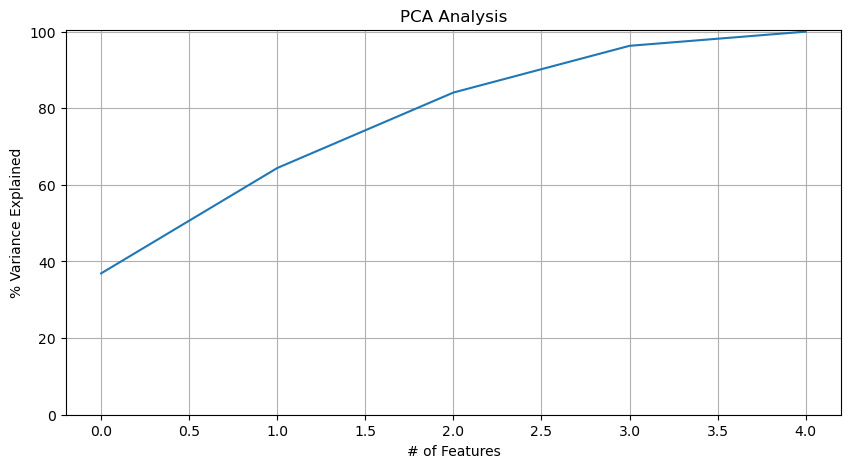

In [5]:
pca = PCA(n_components=5)
pca.fit(df_scale)

variance = pca.explained_variance_ratio_ 
var = np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(10,5))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.grid(True)
plt.plot(var)

In [6]:
pca = PCA(n_components=3)
pca.fit(df_scale)
pca_scale = pca.transform(df_scale)
pca_df = pd.DataFrame(pca_scale, columns=['pc1', 'pc2', 'pc3'])
print(pca.explained_variance_ratio_)

[0.36908003 0.27465456 0.1970703 ]


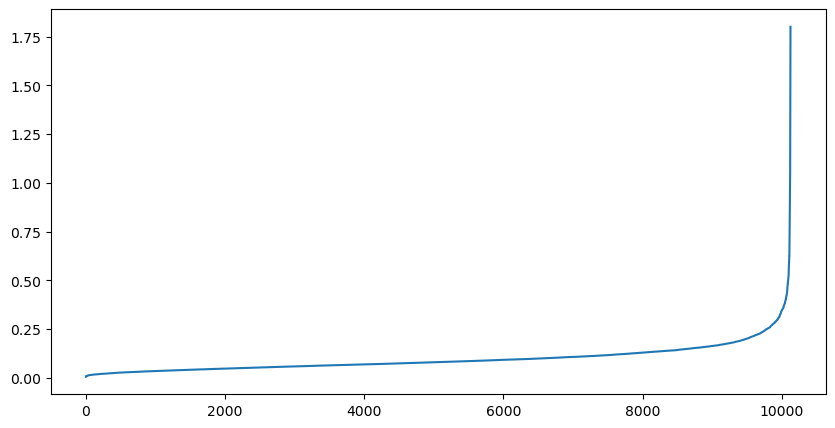

In [7]:
plt.figure(figsize=(10,5))
nn = NearestNeighbors(n_neighbors=5).fit(pca_df)
distances, idx = nn.kneighbors(pca_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()

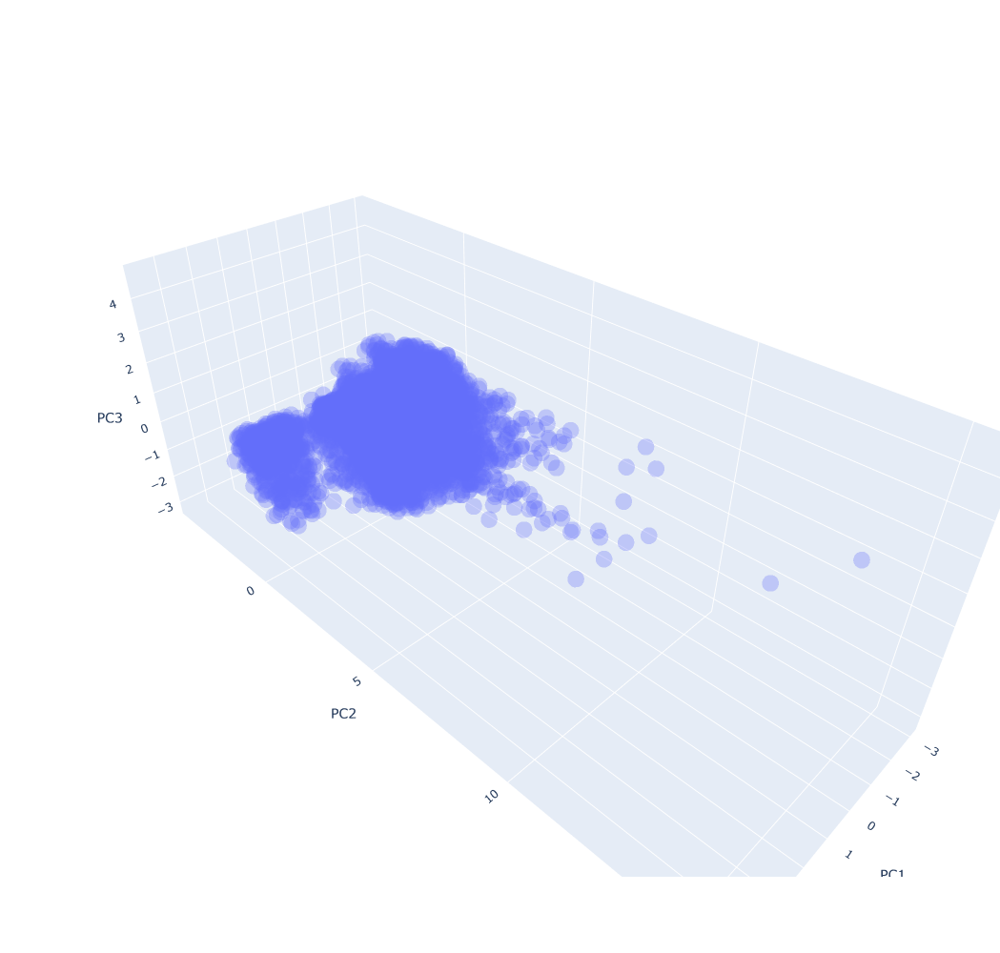

In [8]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
trace = go.Scatter3d(x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2], mode='markers',
                     marker=dict(colorscale='Greys', opacity=0.3, size = 10, ))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

####

#### DBSCAN

eps: The maximum distance between two points for them to be considered neighbors. Points that are within eps distance of each other are                considered part of the same cluster.

min_samples: The minimum number of points required for a point to be considered a core point. Points that have fewer than min_samples neighbors                are labeled as noise.

##### Vizualizing

#### Reduce the eps and min_samples 

In [9]:
# Apply DBSCAN
dbscan2 = DBSCAN(eps=0.25, min_samples=3)
labels2 = dbscan2.fit_predict(features_scaled)

# Number of clusters in labels
n_clusters_ = len(set(labels2)) - (1 if -1 in labels2 else 0)
n_noise_ = list(labels2).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 326
Estimated number of noise points: 5525


In [10]:
# Ensure that you're computing the silhouette score only for data points that were clustered (excluding outliers)
# Outliers are labeled as -1 in DBSCAN
mask = labels2 != -1
filtered_labels = labels2[mask]
filtered_features = features_scaled[mask]

# Calculating the silhouette score
if len(np.unique(filtered_labels)) > 1:  # Silhouette score is only meaningful if there are more than one cluster (excluding outliers)
    silhouette_avg = silhouette_score(filtered_features, filtered_labels)
    print(f"Silhouette Score: {silhouette_avg}")
else:
    print("Silhouette Score cannot be calculated with a single cluster.")

Silhouette Score: -0.3615333910298937


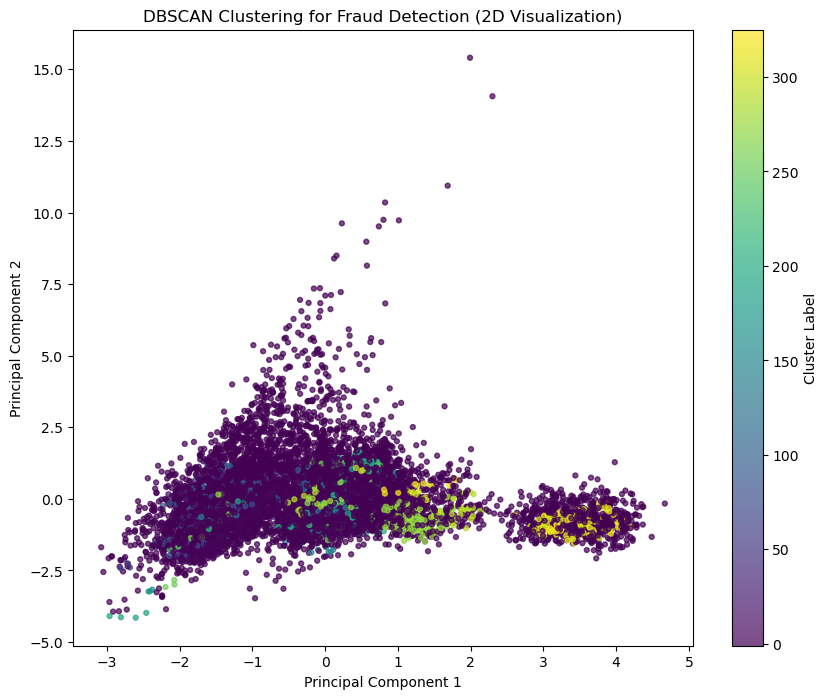

In [11]:
# Apply PCA for dimensionality reduction to 2D for visualization
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

# Plotting the results in 2D
plt.figure(figsize=(10, 8))
plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels2, cmap='viridis', marker='.', s=50, alpha=0.7)
plt.title('DBSCAN Clustering for Fraud Detection (2D Visualization)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

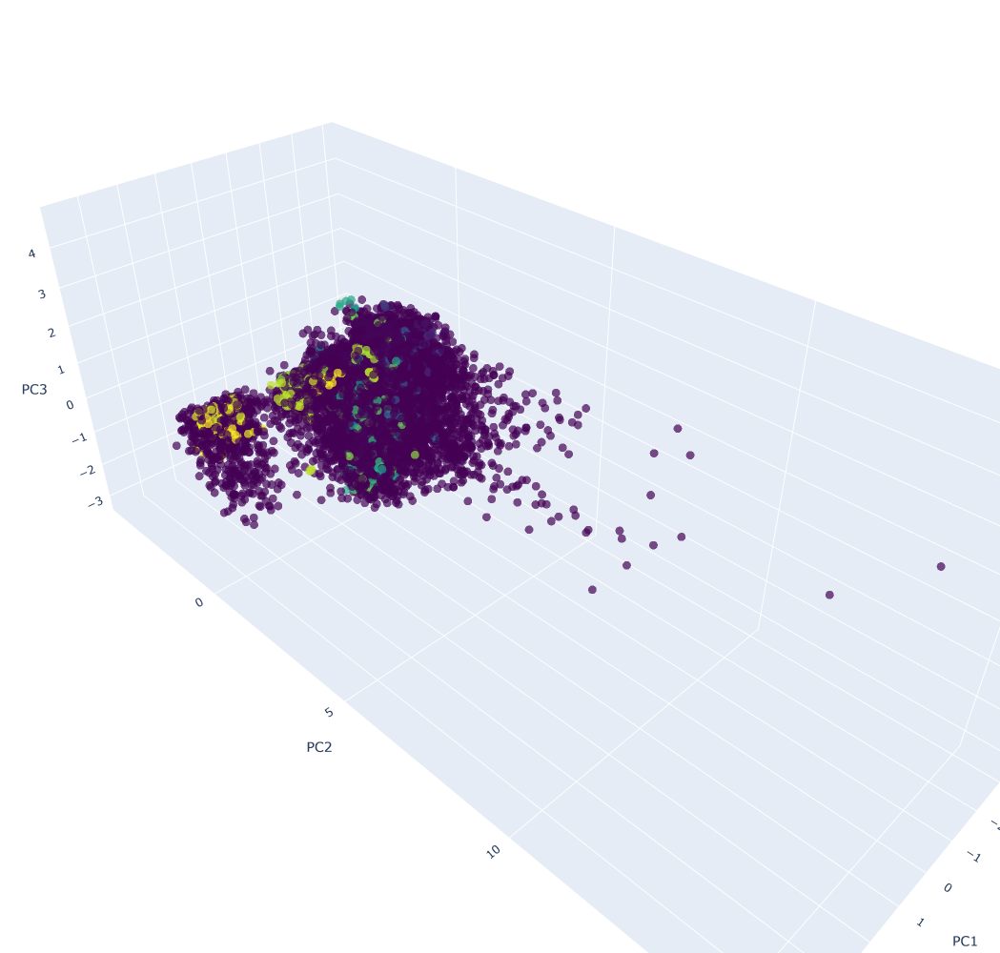

In [12]:
# Apply PCA for dimensionality reduction to 3D for visualization
pca_3d = PCA(n_components=3)
features_pca_3d = pca_3d.fit_transform(features_scaled)

# Convert the PCA results and labels into a DataFrame
pca_df = pd.DataFrame(features_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Cluster'] = labels2 

# Scene configuration
Scene = dict(xaxis=dict(title='PC1'), yaxis=dict(title='PC2'), zaxis=dict(title='PC3'))

# Trace configuration
trace = go.Scatter3d(
    x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
    mode='markers',
    marker=dict(
        color=pca_df['Cluster'],  # Use cluster labels for coloring
        colorscale='Viridis', 
        opacity=0.7,
        size=5,
    )
)

# Layout configuration
layout = go.Layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=Scene,
    height=1000,
    width=1000
)

# Combine trace and layout into a figure
data = [trace]
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

#### Increase the eps and min_samples 

In [13]:
# Apply DBSCAN
dbscan3 = DBSCAN(eps=1, min_samples=25)
labels3 = dbscan2.fit_predict(features_scaled)

# Number of clusters in labels
n_clusters_ = len(set(labels3)) - (1 if -1 in labels3 else 0)
n_noise_ = list(labels3).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 326
Estimated number of noise points: 5525


In [14]:
# Ensure that you're computing the silhouette score only for data points that were clustered (excluding outliers)
# Outliers are labeled as -1 in DBSCAN
mask = labels3 != -1
filtered_labels = labels3[mask]
filtered_features = features_scaled[mask]

# Calculating the silhouette score
if len(np.unique(filtered_labels)) > 1:  # Silhouette score is only meaningful if there are more than one cluster (excluding outliers)
    silhouette_avg = silhouette_score(filtered_features, filtered_labels)
    print(f"Silhouette Score: {silhouette_avg}")
else:
    print("Silhouette Score cannot be calculated with a single cluster.")

Silhouette Score: -0.3615333910298937


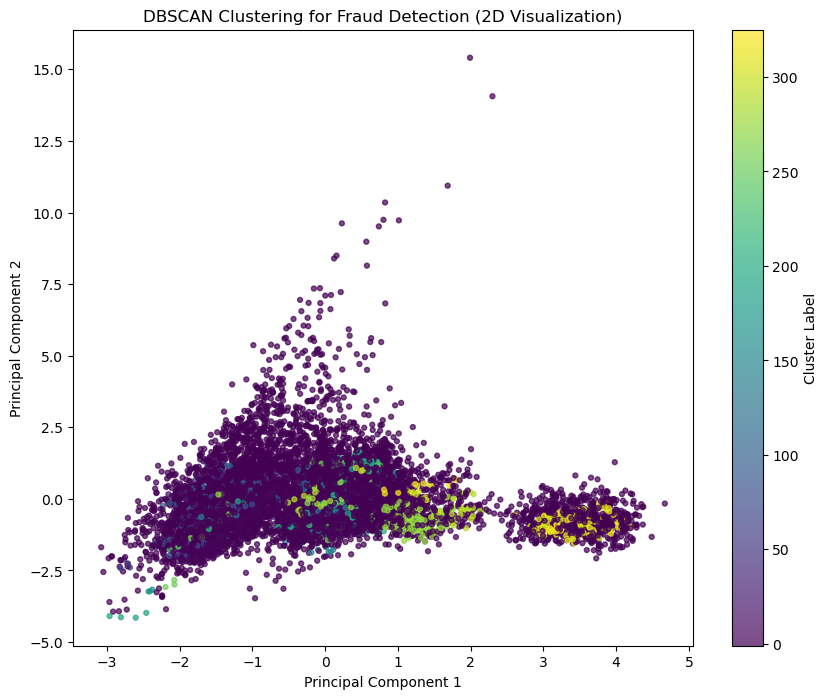

In [15]:
# Apply PCA for dimensionality reduction to 2D for visualization
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

# Plotting the results in 2D
plt.figure(figsize=(10, 8))
plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels3, cmap='viridis', marker='.', s=50, alpha=0.7)
plt.title('DBSCAN Clustering for Fraud Detection (2D Visualization)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

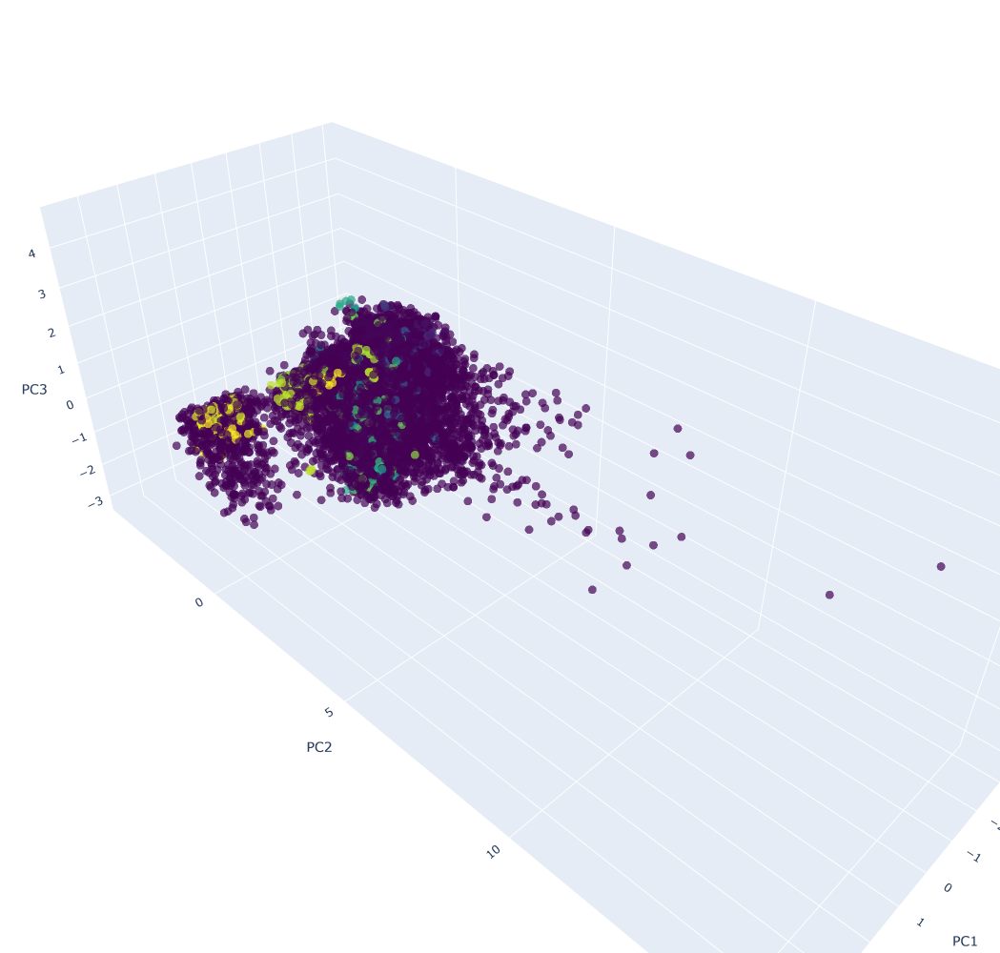

In [16]:
# Apply PCA for dimensionality reduction to 3D for visualization
pca_3d = PCA(n_components=3)
features_pca_3d = pca_3d.fit_transform(features_scaled)

# Convert the PCA results and labels into a DataFrame
pca_df = pd.DataFrame(features_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Cluster'] = labels3

# Scene configuration
Scene = dict(xaxis=dict(title='PC1'), yaxis=dict(title='PC2'), zaxis=dict(title='PC3'))

# Trace configuration
trace = go.Scatter3d(
    x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
    mode='markers',
    marker=dict(
        color=pca_df['Cluster'],  # Use cluster labels for coloring
        colorscale='Viridis', 
        opacity=0.7,
        size=5,
    )
)

# Layout configuration
layout = go.Layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=Scene,
    height=1000,
    width=1000
)

# Combine trace and layout into a figure
data = [trace]
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

#### Best fit

In [17]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.9, min_samples=21)
labels = dbscan.fit_predict(features_scaled)

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 260


In [18]:
# Count of unique labels to understand the distribution, including outliers
unique_labels, counts_labels = np.unique(labels, return_counts=True)
dict(zip(unique_labels, counts_labels))

{-1: 260, 0: 9123, 1: 744}

In [19]:
# Ensure that you're computing the silhouette score only for data points that were clustered (excluding outliers)
# Outliers are labeled as -1 in DBSCAN
mask = labels != -1
filtered_labels = labels[mask]
filtered_features = features_scaled[mask]

# Calculating the silhouette score
if len(np.unique(filtered_labels)) > 1:  # Silhouette score is only meaningful if there are more than one cluster (excluding outliers)
    silhouette_avg = silhouette_score(filtered_features, filtered_labels)
    print(f"Silhouette Score: {silhouette_avg}")
else:
    print("Silhouette Score cannot be calculated with a single cluster.")

Silhouette Score: 0.4320559830562964


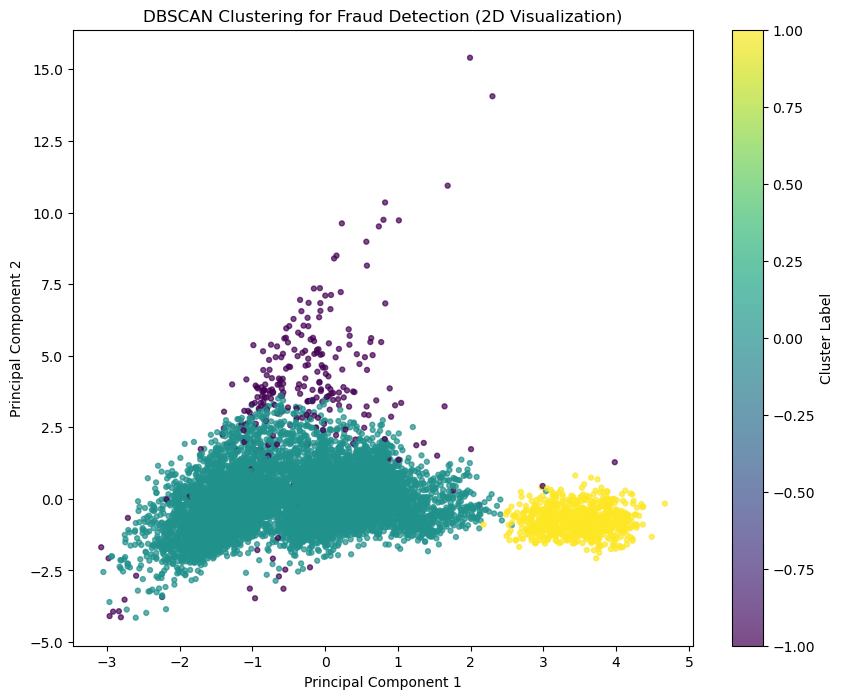

In [20]:
# Apply PCA for dimensionality reduction to 2D for visualization
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

# Plotting the results in 2D
plt.figure(figsize=(10, 8))
plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='viridis', marker='.', s=50, alpha=0.7)
plt.title('DBSCAN Clustering for Fraud Detection (2D Visualization)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

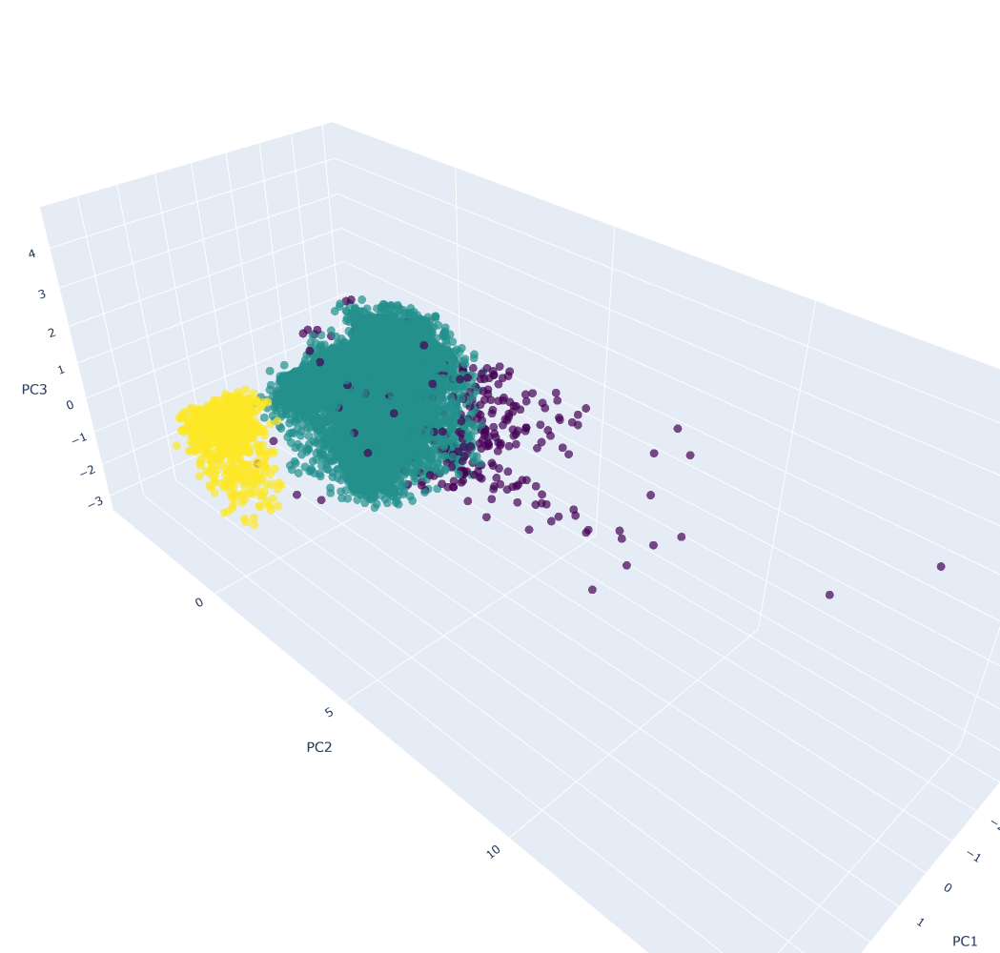

In [21]:
# Apply PCA for dimensionality reduction to 3D for visualization
pca_3d = PCA(n_components=3)
features_pca_3d = pca_3d.fit_transform(features_scaled)

# Convert the PCA results and labels into a DataFrame
pca_df = pd.DataFrame(features_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Cluster'] = labels

# Scene configuration
Scene = dict(xaxis=dict(title='PC1'), yaxis=dict(title='PC2'), zaxis=dict(title='PC3'))

# Trace configuration
trace = go.Scatter3d(
    x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
    mode='markers',
    marker=dict(
        color=pca_df['Cluster'],  # Use cluster labels for coloring
        colorscale='Viridis', 
        opacity=0.7,
        size=5,
    )
)

# Layout configuration
layout = go.Layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=Scene,
    height=1000,
    width=1000
)

# Combine trace and layout into a figure
data = [trace]
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()